### Import Libraries
We will be new python libraries such as folium and statsmodels.api

Take note to download the libraries for the code to run!<br>
The following links will assist in the installation

https://www.analyticsvidhya.com/blog/2020/06/guide-geospatial-analysis-folium-python/

https://www.statsmodels.org/stable/install.html


In [1]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap
import warnings
import itertools
import statsmodels.api as sm
import datetime
import random
plt.style.use('fivethirtyeight')

In [2]:
warnings.filterwarnings('ignore')

In [3]:
avData = pd.read_csv('AviationData.csv',encoding='cp1252')

In [4]:
avData


,Event.Id,Investigation.Type,Accident.Number,Event.Date,Location,Country,Latitude,Longitude,Airport.Code,Airport.Name,...,Purpose.of.flight,Air.carrier,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Weather.Condition,Broad.phase.of.flight,Report.Status,Publication.Date
0,20001218X45444,Accident,SEA87LA080,1948-10-24,"MOOSE CREEK, ID",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,2.0,0.0,0.0,0.0,UNK,Cruise,Probable Cause,NaN
1,20001218X45447,Accident,LAX94LA336,1962-07-19,"BRIDGEPORT, CA",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,4.0,0.0,0.0,0.0,UNK,Unknown,Probable Cause,19-09-1996
2,20061025X01555,Accident,NYC07LA005,1974-08-30,"Saltville, VA",United States,36.922223,-81.878056,NaN,NaN,...,Personal,NaN,3.0,NaN,NaN,NaN,IMC,Cruise,Probable Cause,26-02-2007
3,20001218X45448,Accident,LAX96LA321,1977-06-19,"EUREKA, CA",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,2.0,0.0,0.0,0.0,IMC,Cruise,Probable Cause,12-09-2000
4,20041105X01764,Accident,CHI79FA064,1979-08-02,"Canton, OH",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,1.0,2.0,NaN,0.0,VMC,Approach,Probable Cause,16-04-1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87277,20211223104439,Accident,GAA22WA054,2021-12-21,"Auxerre, OF",United States,475047N,0032948W,NaN,NaN,...,Unknown,NaN,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
87278,20211228104450,Accident,WPR22LA069,2021-12-22,"Auburn, CA",United States,NaN,NaN,NaN,NaN,...,Positioning,"Fox Two, LLC",0.0,0.0,1.0,0.0,NaN,NaN,NaN,NaN
87279,20211227104443,Accident,CEN22FA082,2021-12-26,"Hardy, AR",United States,NaN,NaN,NaN,NaN,...,Personal,NaN,2.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN
87280,20211230104454,Accident,ERA22LA097,2021-12-29,"Marathon, FL",United States,NaN,NaN,NaN,NaN,...,NaN,ExecAir,0.0,3.0,0.0,0.0,NaN,NaN,NaN,NaN


#### Looking through the data, we can sum up that the some of the necessary information that are more related to aviation accident will be aircraft damage, number of casualties, etc

In [5]:
avData.head()
avData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87282 entries, 0 to 87281
Data columns (total 31 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Event.Id                87282 non-null  object 
 1   Investigation.Type      87282 non-null  object 
 2   Accident.Number         87282 non-null  object 
 3   Event.Date              87282 non-null  object 
 4   Location                87230 non-null  object 
 5   Country                 87056 non-null  object 
 6   Latitude                33073 non-null  object 
 7   Longitude               33064 non-null  object 
 8   Airport.Code            49322 non-null  object 
 9   Airport.Name            51955 non-null  object 
 10  Injury.Severity         86399 non-null  object 
 11  Aircraft.damage         84272 non-null  object 
 12  Aircraft.Category       30783 non-null  object 
 13  Registration.Number     85965 non-null  object 
 14  Make                    87219 non-null

#### False data alert: the last row of the data are invalid as the date of the accident is 2022-12-08, which is invalid, therefore we have to drop it.

In [6]:
avData1 = avData.drop(['Event.Id','Accident.Number','Airport.Code','Airport.Name','Injury.Severity','Aircraft.Category','Registration.Number','Make','Model','Engine.Type','FAR.Description','Schedule','Purpose.of.flight','Air.carrier','Weather.Condition','Report.Status','Publication.Date'],axis = 1)
avData1 = avData1.drop(index = 87281,axis=1)

In [7]:
avData1

,Investigation.Type,Event.Date,Location,Country,Latitude,Longitude,Aircraft.damage,Amateur.Built,Number.of.Engines,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Broad.phase.of.flight
0,Accident,1948-10-24,"MOOSE CREEK, ID",United States,NaN,NaN,Destroyed,No,1.0,2.0,0.0,0.0,0.0,Cruise
1,Accident,1962-07-19,"BRIDGEPORT, CA",United States,NaN,NaN,Destroyed,No,1.0,4.0,0.0,0.0,0.0,Unknown
2,Accident,1974-08-30,"Saltville, VA",United States,36.922223,-81.878056,Destroyed,No,1.0,3.0,NaN,NaN,NaN,Cruise
3,Accident,1977-06-19,"EUREKA, CA",United States,NaN,NaN,Destroyed,No,1.0,2.0,0.0,0.0,0.0,Cruise
4,Accident,1979-08-02,"Canton, OH",United States,NaN,NaN,Destroyed,No,NaN,1.0,2.0,NaN,0.0,Approach
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87276,Incident,2021-12-21,"Newcastle, OF",Ireland,053216N,0062918W,Substantial,N,NaN,0.0,0.0,0.0,0.0,NaN
87277,Accident,2021-12-21,"Auxerre, OF",United States,475047N,0032948W,Destroyed,N,1.0,1.0,0.0,0.0,0.0,NaN
87278,Accident,2021-12-22,"Auburn, CA",United States,NaN,NaN,NaN,N,NaN,0.0,0.0,1.0,0.0,NaN
87279,Accident,2021-12-26,"Hardy, AR",United States,NaN,NaN,NaN,N,NaN,2.0,0.0,0.0,0.0,NaN


#### Remove Unknowns and Others from Broad Phase of Flight to clean the data for exploration analysis

In [8]:
avData2=avData1[avData1["Broad.phase.of.flight"].str.contains("Unknown|Other") == False]

In [9]:
avData1

,Investigation.Type,Event.Date,Location,Country,Latitude,Longitude,Aircraft.damage,Amateur.Built,Number.of.Engines,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured,Broad.phase.of.flight
0,Accident,1948-10-24,"MOOSE CREEK, ID",United States,NaN,NaN,Destroyed,No,1.0,2.0,0.0,0.0,0.0,Cruise
1,Accident,1962-07-19,"BRIDGEPORT, CA",United States,NaN,NaN,Destroyed,No,1.0,4.0,0.0,0.0,0.0,Unknown
2,Accident,1974-08-30,"Saltville, VA",United States,36.922223,-81.878056,Destroyed,No,1.0,3.0,NaN,NaN,NaN,Cruise
3,Accident,1977-06-19,"EUREKA, CA",United States,NaN,NaN,Destroyed,No,1.0,2.0,0.0,0.0,0.0,Cruise
4,Accident,1979-08-02,"Canton, OH",United States,NaN,NaN,Destroyed,No,NaN,1.0,2.0,NaN,0.0,Approach
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87276,Incident,2021-12-21,"Newcastle, OF",Ireland,053216N,0062918W,Substantial,N,NaN,0.0,0.0,0.0,0.0,NaN
87277,Accident,2021-12-21,"Auxerre, OF",United States,475047N,0032948W,Destroyed,N,1.0,1.0,0.0,0.0,0.0,NaN
87278,Accident,2021-12-22,"Auburn, CA",United States,NaN,NaN,NaN,N,NaN,0.0,0.0,1.0,0.0,NaN
87279,Accident,2021-12-26,"Hardy, AR",United States,NaN,NaN,NaN,N,NaN,2.0,0.0,0.0,0.0,NaN


### Visualising Data on the World Map

In [10]:
location_data = avData2[['Latitude','Longitude']]

In [11]:
location_data

,Latitude,Longitude
0,NaN,NaN
2,36.922223,-81.878056
3,NaN,NaN
4,NaN,NaN
5,42.445277,-70.758333
...,...,...
63907,28.958056,-89.258889
63908,34.688611,-87.92
63909,35.542222,-120.522778
63910,45.866111,-95.394444


In [12]:
newlocation_data = location_data.dropna()

In [13]:
world_map= folium.Map(tiles="Stamen Terrain")
marker_cluster = MarkerCluster().add_to(world_map)

for i in range(len(newlocation_data)):
        lat = newlocation_data.iloc[i]['Latitude']
        long = newlocation_data.iloc[i]['Longitude']

        folium.CircleMarker(location = [lat, long], fill =True).add_to(marker_cluster)

world_map

#### Visualise number of accidents in each country and calculate percentage of USA and the world

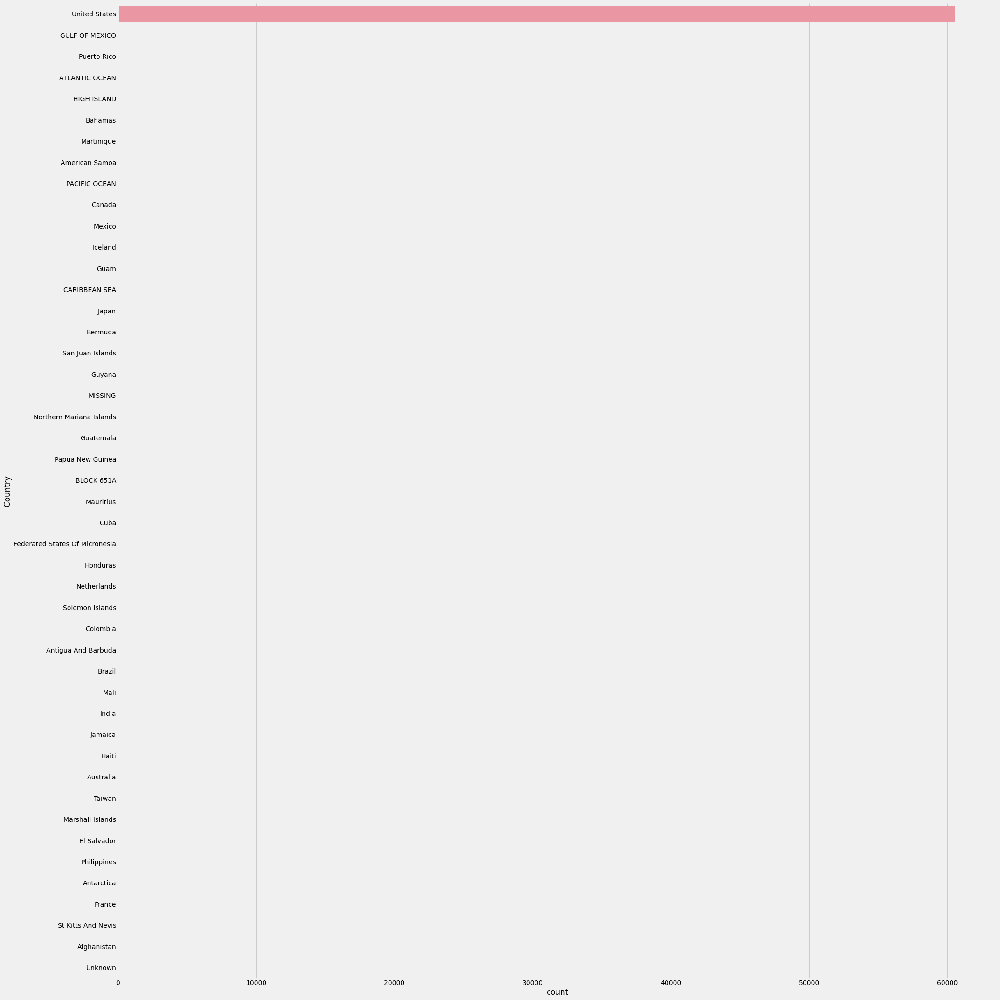

In [14]:
sb.catplot(y = "Country", data=avData2, kind="count", height=30)

In [15]:
country=avData2["Country"].value_counts()
total=avData2["Country"].count()
USA=country["United States"]
percentage=(USA/total)*100
print("Percentage of accidents occuring in the United States comparing to the world: ", percentage)

Percentage of accidents occuring in the United States comparing to the world:  99.4888903497239


In [16]:
aircraftdmg=avData2[["Aircraft.damage","Total.Fatal.Injuries", "Total.Serious.Injuries", "Total.Minor.Injuries", "Total.Uninjured"]]


In [17]:
aircraftdmg.dropna()

,Aircraft.damage,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured
0,Destroyed,2.0,0.0,0.0,0.0
3,Destroyed,2.0,0.0,0.0,0.0
7,Substantial,0.0,0.0,0.0,2.0
8,Substantial,0.0,0.0,0.0,2.0
9,Substantial,0.0,0.0,3.0,0.0
...,...,...,...,...,...
63893,Substantial,0.0,0.0,2.0,0.0
63896,Minor,0.0,0.0,0.0,4.0
63900,Substantial,0.0,1.0,0.0,0.0
63906,Destroyed,2.0,0.0,0.0,0.0


#### Transpose the series by using .T

In [18]:
accidents = aircraftdmg.groupby(['Aircraft.damage']).sum()
accidents
newaccidents = accidents.T

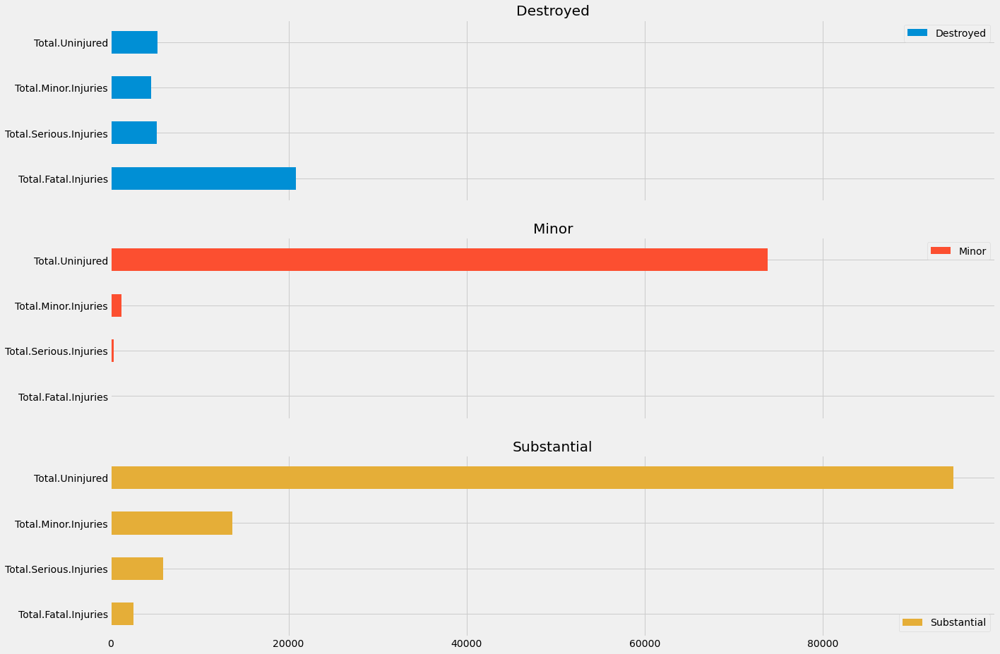

In [19]:
plot = newaccidents.plot.barh(subplots=True, figsize=(20, 15))

In [20]:
phase_of_flight=avData2[["Broad.phase.of.flight","Aircraft.damage","Total.Fatal.Injuries", "Total.Serious.Injuries", "Total.Minor.Injuries","Total.Uninjured"]]

phase_of_flight_fatalities_clean=phase_of_flight[phase_of_flight["Broad.phase.of.flight"].str.contains("Unknown|Other") == False]
phase_of_flight_fatalities_clean.dropna()

,Broad.phase.of.flight,Aircraft.damage,Total.Fatal.Injuries,Total.Serious.Injuries,Total.Minor.Injuries,Total.Uninjured
0,Cruise,Destroyed,2.0,0.0,0.0,0.0
3,Cruise,Destroyed,2.0,0.0,0.0,0.0
7,Takeoff,Substantial,0.0,0.0,0.0,2.0
8,Landing,Substantial,0.0,0.0,0.0,2.0
9,Cruise,Substantial,0.0,0.0,3.0,0.0
...,...,...,...,...,...,...
63893,Takeoff,Substantial,0.0,0.0,2.0,0.0
63896,Climb,Minor,0.0,0.0,0.0,4.0
63900,Cruise,Substantial,0.0,1.0,0.0,0.0
63906,Maneuvering,Destroyed,2.0,0.0,0.0,0.0


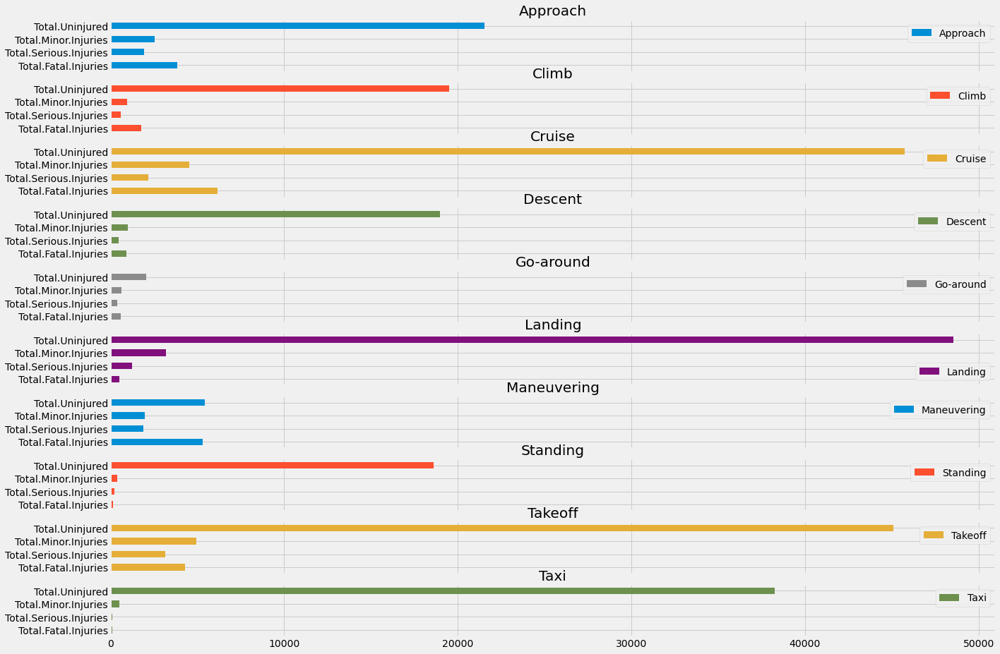

In [21]:
phase = phase_of_flight_fatalities_clean.groupby(['Broad.phase.of.flight']).sum()
newphase = phase.T
plot = newphase.plot.barh(subplots=True, figsize=(20, 15))

#### Zoom into these 3 Phase of Flight that are most relevant

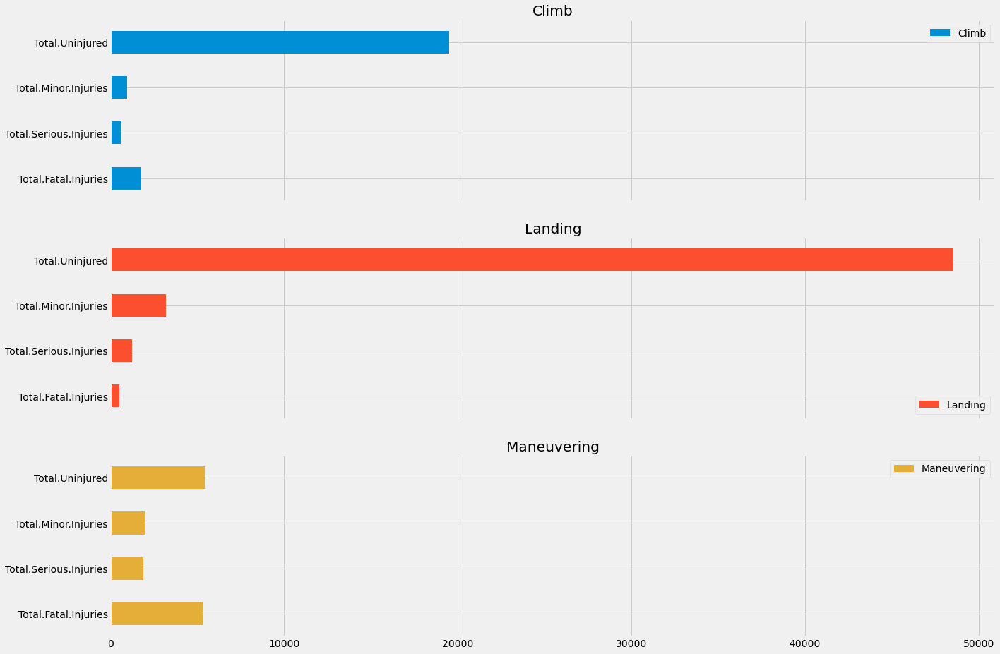

In [22]:
phase_final = phase_of_flight_fatalities_clean[phase_of_flight_fatalities_clean["Broad.phase.of.flight"].str.contains("Climb|Maneuvering|Landing") == True]
phase_final.dropna()
phase_final = phase_final.groupby(['Broad.phase.of.flight']).sum()
newphase = phase_final.T
plot = newphase.plot.barh(subplots=True, figsize=(20, 15))

### Fitting the accident data into ARIMA Model
This is to forecast and predict the number of accidents

In [23]:
accidentDates = pd.DataFrame(avData1['Event.Date'])
accidentDates['Values'] = pd.Series([int(1) for x in range(len(accidentDates.index))])

In [24]:
accidentDates['Event.Date']= pd.to_datetime(accidentDates['Event.Date'])
accidentDates.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 87281 entries, 0 to 87280
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Event.Date  87281 non-null  datetime64[ns]
 1   Values      87281 non-null  int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 2.0 MB


In [25]:
accidentDates

,Event.Date,Values
0,1948-10-24,1
1,1962-07-19,1
2,1974-08-30,1
3,1977-06-19,1
4,1979-08-02,1
...,...,...
87276,2021-12-21,1
87277,2021-12-21,1
87278,2021-12-22,1
87279,2021-12-26,1


#### Convert all the days in a single month to be the same date (YYYY-MM-01)

In [26]:
accidentDates['Event.Date'] = accidentDates['Event.Date'].apply(lambda x: x.replace(day=1))

In [27]:
accidentDates

,Event.Date,Values
0,1948-10-01,1
1,1962-07-01,1
2,1974-08-01,1
3,1977-06-01,1
4,1979-08-01,1
...,...,...
87276,2021-12-01,1
87277,2021-12-01,1
87278,2021-12-01,1
87279,2021-12-01,1


#### Data will start from 1982 to current time

In [28]:
accidentDates[['Event.Date','Values']]
accidentDates = accidentDates[(accidentDates['Event.Date'] > '1982-01-01')]

In [29]:
dates = accidentDates.groupby(['Event.Date']).sum()

Plot a line graph for dates

In [30]:
dates

,Values
Event.Date,
1982-02-01,232
1982-03-01,280
1982-04-01,303
1982-05-01,387
1982-06-01,349
...,...
2021-08-01,149
2021-09-01,166
2021-10-01,134


#### Plot the dates against number of accident per month in every year

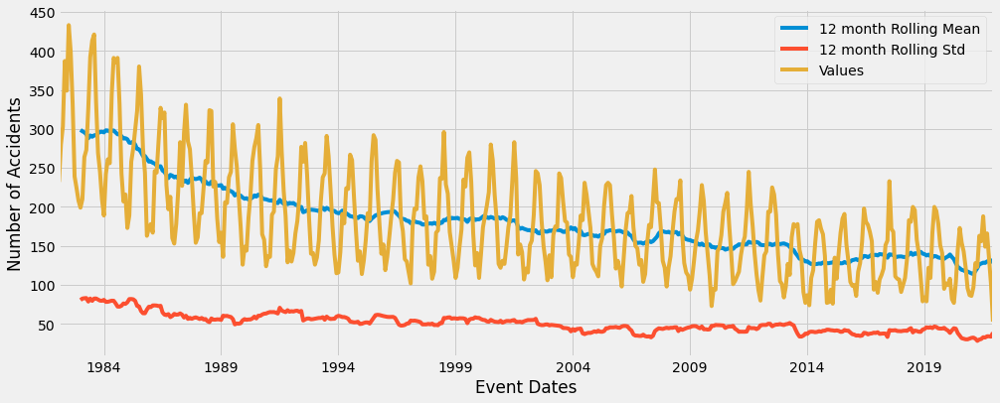

In [31]:
num_values = dates['Values']
num_values.rolling(12).mean().plot(label='12 month Rolling Mean') 
num_values.rolling(12).std().plot(label='12 month Rolling Std') 
num_values.plot(figsize=(15, 6)) 
plt.xlabel("Event Dates")
plt.ylabel("Number of Accidents")
plt.legend()

#### Creating ARIMA Model

In [32]:
# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0, 2)

# Generate all different combinations of p, d and q triplets using cross product
pdq = list(itertools.product(p, d, q))

# A list comprehension to generate all different combinations of seasonal p, q and q triplets
season_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], season_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], season_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], season_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], season_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [33]:
warnings.filterwarnings("ignore") # specify to ignore warning messages

for i in pdq:
    for j in season_pdq:
            model = sm.tsa.statespace.SARIMAX(dates,
                                            order=i,
                                            seasonal_order=j,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)

            results = model.fit()

            print('ARIMA{}x{}12 - AIC:{}'.format(i, j, results.aic))

ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:6394.999712225225
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:5695.997094267852
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:4270.045630054262
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:4087.3077911561195
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:4244.1465622331525
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:4092.2278614885417
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:4098.079080877108
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:4086.0603783386214
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:5817.699906838177
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:5289.2178191038665
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:4259.9370607337
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:4057.2019403806316
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:4244.853589506419
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:4070.730963907924
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:4083.8315869949606
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:4055.3459901208453
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:4733.584373741294
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:4501.89036794032
ARIMA

In [34]:
model = sm.tsa.statespace.SARIMAX(dates,
                                order=(1, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results = model.fit()

print(results.summary())

                                     SARIMAX Results                                      
Dep. Variable:                             Values   No. Observations:                  479
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 12)   Log Likelihood               -1949.361
Date:                            Tue, 05 Apr 2022   AIC                           3908.722
Time:                                    16:17:23   BIC                           3929.290
Sample:                                02-01-1982   HQIC                          3916.827
                                     - 12-01-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0933      0.054      1.736      0.083      -0.012       0.199
ma.L1         -0.8957      0.027   

#### Plot model diagnosis

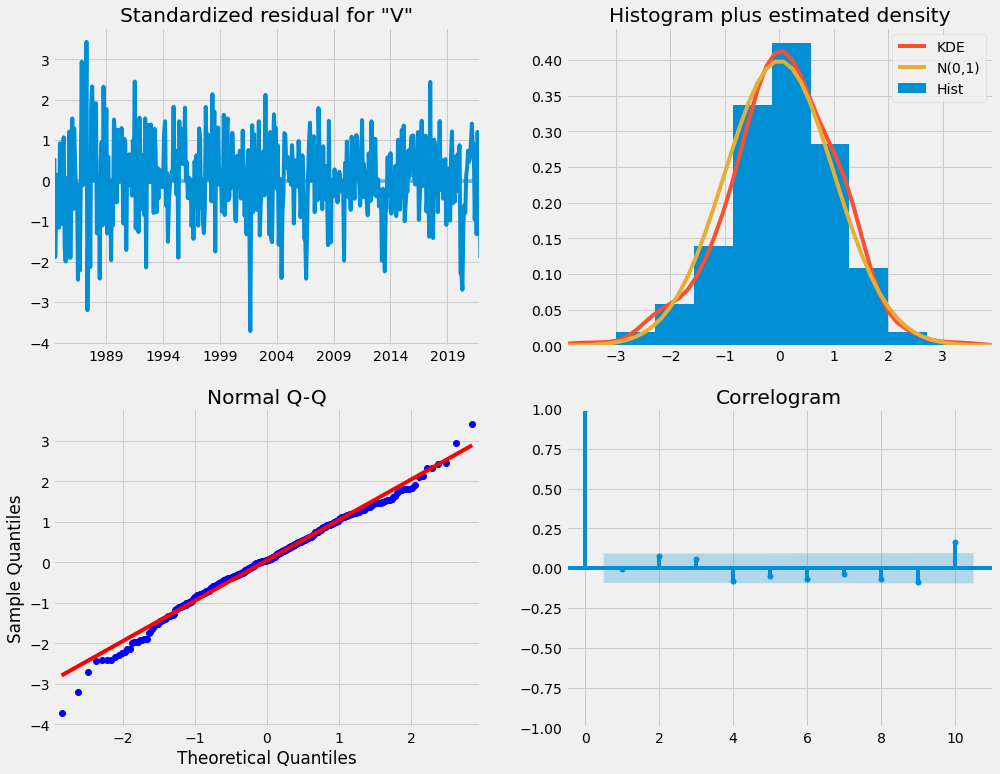

In [35]:
## Shows 4 plots: Residual, Density, Normal Q-Q and Correlogram
results.plot_diagnostics(figsize=(15, 12))
plt.show()

### Forecasting of Aviation Accidents 

#### Predicting aviation accidents using past data from 1982 to current time and getting dynamic forecast from 2010 onwards

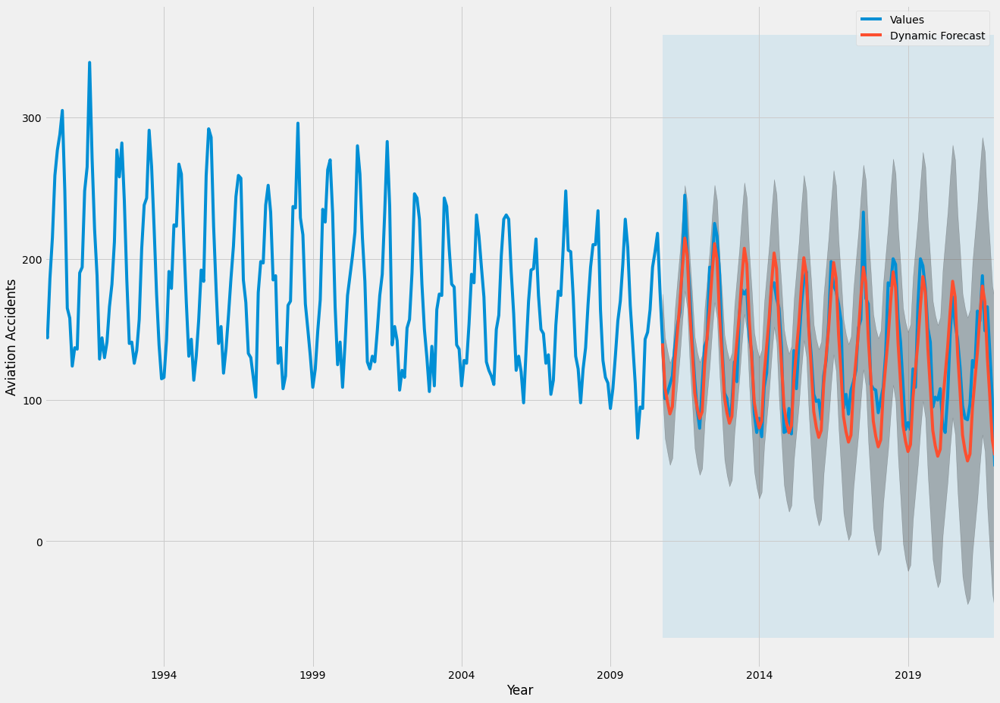

In [36]:
## Normal prediction starts from 1982
prediction = results.get_prediction(start=pd.to_datetime('1982-02-1'), dynamic=False)
prediction_ci = prediction.conf_int()
## Dynamic prediction starts from 2010
prediction_dynamic = results.get_prediction(start=pd.to_datetime('2010-10-01'), dynamic=True, full_results=True)
prediction_dynamic_ci = prediction_dynamic.conf_int()

ax = dates['1990':].plot(label='observed', figsize=(20, 15))
prediction_dynamic.predicted_mean.plot(label='Dynamic Forecast', ax=ax)

ax.fill_between(prediction_dynamic_ci.index,
                prediction_dynamic_ci.iloc[:, 0],
                prediction_dynamic_ci.iloc[:, 1], color='k', alpha=.25)

ax.fill_betweenx(ax.get_ylim(), pd.to_datetime('2010-10-01'), dates.index[-1],
                 alpha=.1, zorder=-1)

ax.set_xlabel('Year')
ax.set_ylabel('Aviation Accidents')

plt.legend()
plt.show()

#### Forecasting results to the future for the next 10 years

In [37]:
# Get forecast 100 steps ahead in future
prediction_uc = results.get_forecast(steps=100)

# Get confidence intervals of forecasts
prediction_ci = prediction_uc.conf_int()

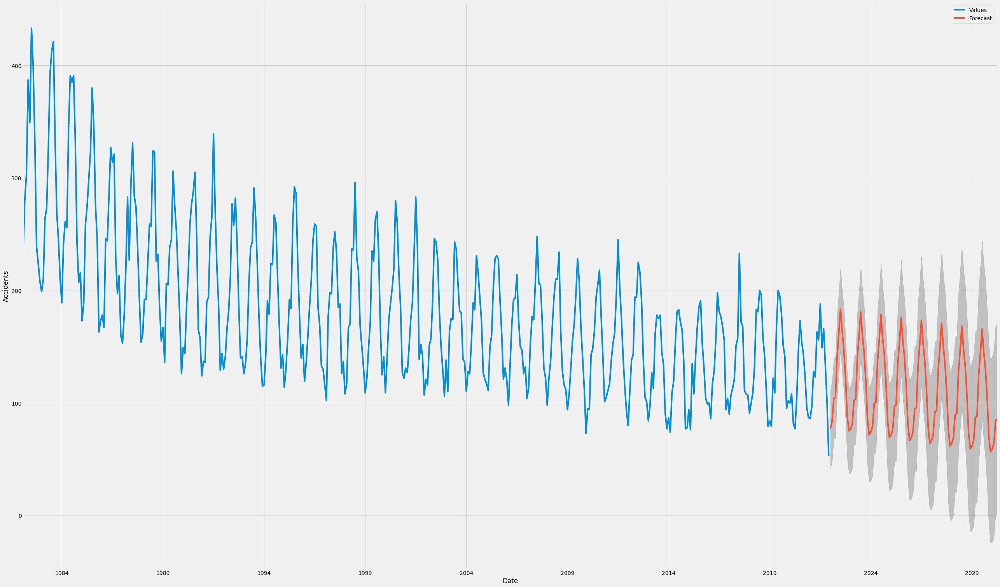

In [38]:
ax = dates.plot(label='observed', figsize=(40, 25))
prediction_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(prediction_ci.index,
                prediction_ci.iloc[:, 0],
                prediction_ci.iloc[:, 1], color='k', alpha=.2)

ax.set_xlabel('Date')
ax.set_ylabel('Accidents')

plt.legend()
plt.show()

### Fit Data to Random Regression Tree
This to predict the number of casualties

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

### Data Cleaning


In [40]:
casualties=avData2[["Total.Fatal.Injuries", "Total.Serious.Injuries", "Total.Minor.Injuries", "Total.Uninjured"]]
casualties_sum = casualties.sum(axis=1).astype(float)
amateur=avData2["Amateur.Built"]
aircraftdmg=avData2["Aircraft.damage"]
no_engines=avData2["Number.of.Engines"]
uninjured=avData2["Total.Uninjured"]
phase_of_flight=avData2["Broad.phase.of.flight"]

Change values of strings to numeric values

In [41]:
amateur_conv = amateur.replace(["Yes","No"], [2,1]).astype(float)
aircraftdmg_conv = aircraftdmg.replace(["Minor","Substantial","Destroyed"], [1,2,3]).astype(float)
phase_conv = phase_of_flight.replace(["Approach","Climb","Cruise","Descent","Go-around","Landing", "Maneuvering","Standing","Takeoff","Taxi"]
                                   ,[1,2,3,4,5,6,7,8,9,10]).astype(float)

regdata=pd.concat([amateur_conv, aircraftdmg_conv,no_engines, phase_conv, casualties_sum], axis=1)
regdata.columns.values[4] = "Sum of Casualties"
regdata.columns.values[3] = "Phase of Flight"
regdata.columns.values[2] = "Number of Engines"
regdata.columns.values[1] = "Aircraft Damage"
regdata.columns.values[0] = "Amateur Built"
regdata_clean=regdata.dropna()
regdata_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58852 entries, 0 to 63911
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Amateur Built      58852 non-null  float64
 1   Aircraft Damage    58852 non-null  float64
 2   Number of Engines  58852 non-null  float64
 3   Phase of Flight    58852 non-null  float64
 4   Sum of Casualties  58852 non-null  float64
dtypes: float64(5)
memory usage: 2.7 MB


X1 = Array of Amateur built,aircraft dmg and no.of engine

Y = Sum of Casualties in one single array (Output)

#### Fitting data with Multi-Variant Random Decision Tree

Use Random Forest Regressor Randomly spilt the dataset of Inputs and Outputs to a desired unbiased train dataset and test dataset (70% Train, 30% Test)

Mean Absolute Error: 2.928507575073237
Mean Squared Error: 233.55578777287712
Root Mean Squared Error: 15.282532112607424
R^2 =  0.3041318214841088


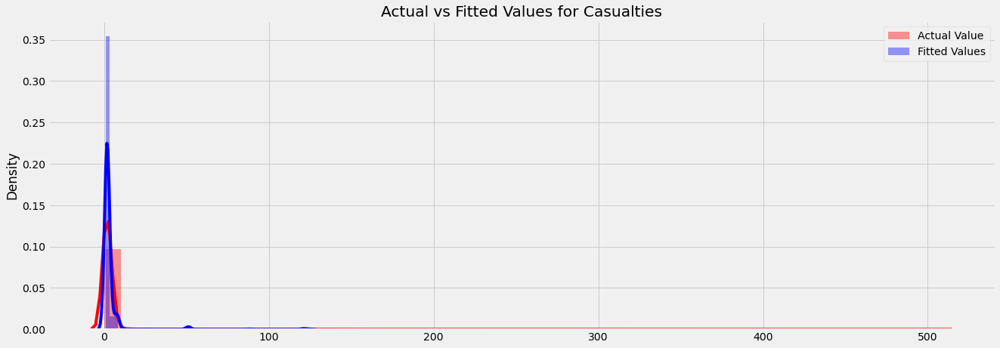

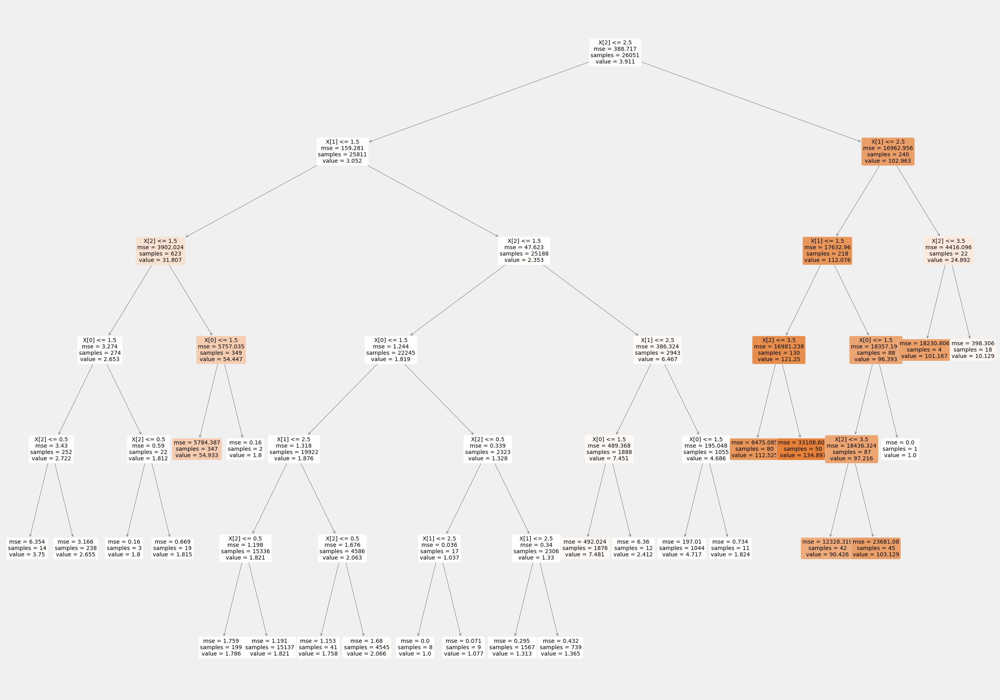

In [42]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn import metrics
from sklearn.metrics import r2_score
import seaborn as sns
from sklearn import tree

X = regdata_clean.iloc[:, 0:3].values
y = regdata_clean.iloc[:, 4].values


X1_train, X1_test, Y1_train, Y1_test = train_test_split(X, y, test_size=0.3, random_state=0)

regressor = RandomForestRegressor(n_estimators= 500, random_state=42)
regressor.fit(X1_train,Y1_train)

Y1_pred=regressor.predict(X1_test)


results=pd.DataFrame({"Actual":Y1_test, "Predicted":Y1_pred})
results

print ( 'Mean Absolute Error:', metrics.mean_absolute_error(Y1_test,Y1_pred))
print ( 'Mean Squared Error:', metrics.mean_squared_error(Y1_test,Y1_pred))
print ( 'Root Mean Squared Error:',np.sqrt (metrics. mean_squared_error(Y1_test, Y1_pred)))




R2 = r2_score(Y1_test,Y1_pred)
print("R^2 = ", R2)

plt.figure(figsize=(20, 7))
ax=sns.distplot(Y1_test, color="r", label = "Actual Value")
sns.distplot(Y1_pred, color="b", label = "Fitted Values" ,ax=ax)
plt.title('Actual vs Fitted Values for Casualties')
plt.legend()
plt.show()
plt.close()

reg_tree=regressor.estimators_[5]
plt.figure(figsize=(40,30))
tree.plot_tree(reg_tree, filled=True,rounded=True,fontsize=14);


